## Preprocessing Image using OpenCV for OCR

In [1]:
import cv2
from PIL import Image

1. Inverted Images
2. Rescaling
3. Binarization
4. Noise Removal
5. Dilation and Erosion
6. Rotation / Deskewing
7. Removing Borders
8. Missing Borders
9. Transparency / Alpha Channel

In [8]:
import cv2
import numpy
import matplotlib.pyplot as plt

img_path = "./data/page_01.jpg"
img = cv2.imread(img_path)
print(type(img), img.shape, img.size)

<class 'numpy.ndarray'> (1522, 1200, 3) 5479200


In [ ]:
#cv2.imshow() crashes in jupyter notebook. So, use matplotlib to display the image
def display(img_path):
    img = cv2.imread(img_path)
    h, w, c = img.shape
    dpi = 80
    
    figsize = h / float(dpi), w / float(dpi)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])  # l, b, w, h
    
    ax.axis("off")
    ax.imshow(img, cmap="gray")
    plt.show()
    

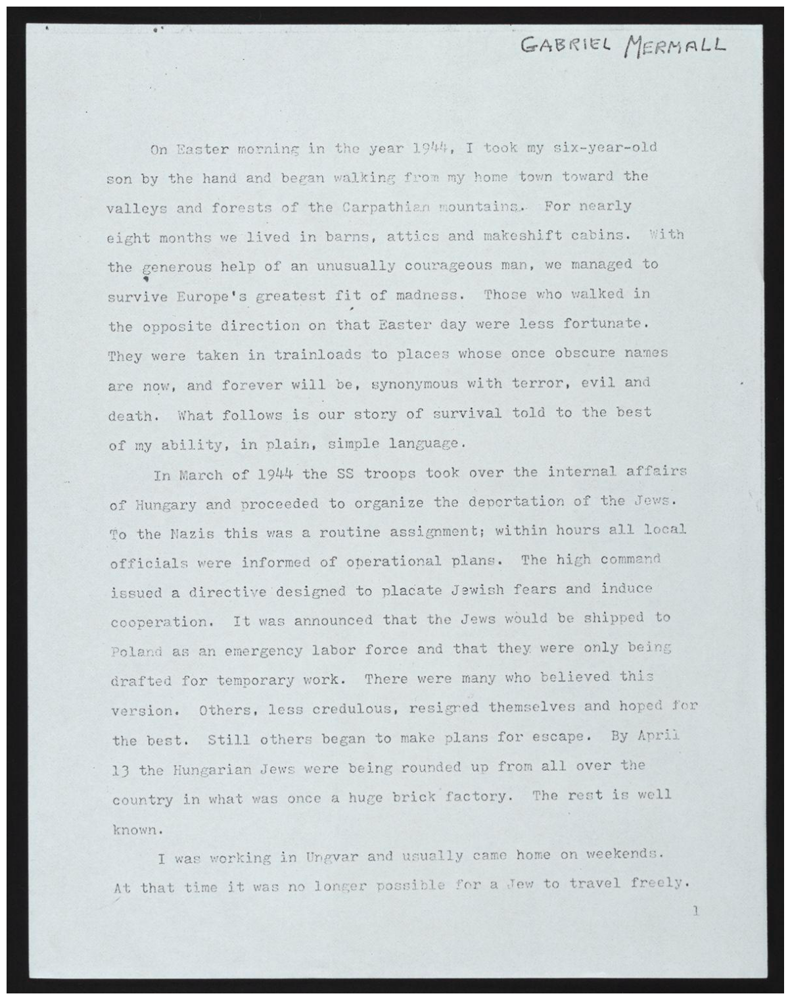

In [19]:
display(img_path)

### Inverted Image

Makes the light pixel dark and viceversa (black to white, white to black)

In [27]:
img_inverted = cv2.bitwise_not(img)
cv2.imwrite("temp/inverted.jpg", img_inverted)

True

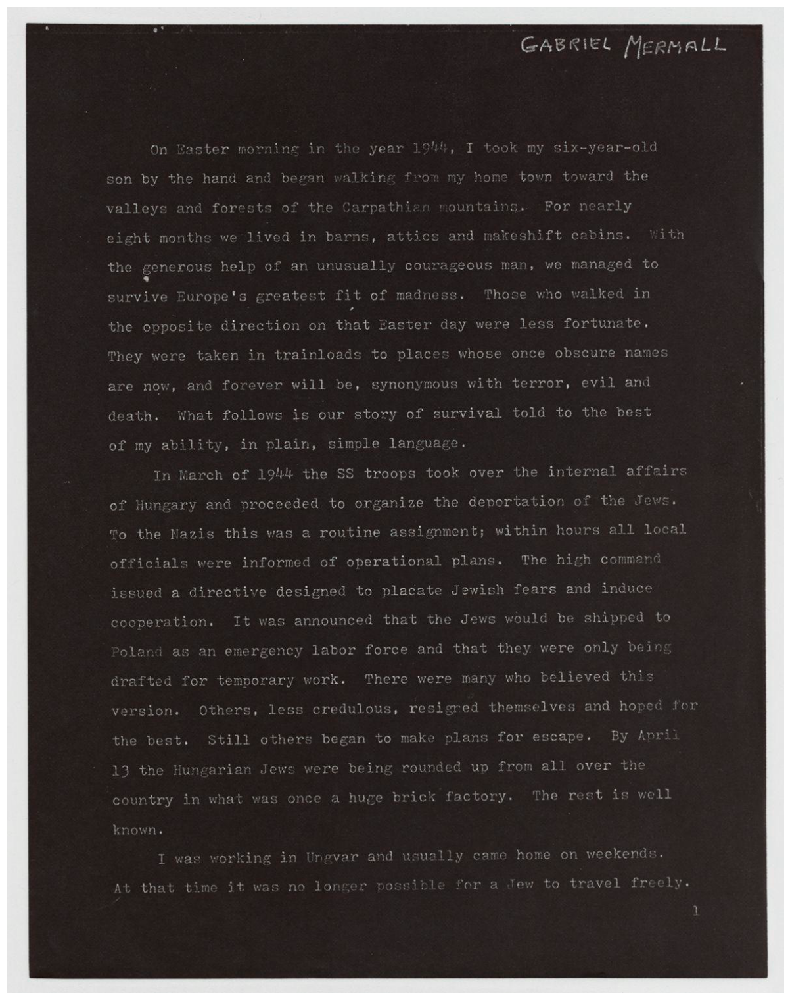

In [29]:
display("temp/inverted.jpg")

### Binarization

Converts an image into black and white. For that, first we need to convert the image to gray scale

In [ ]:
def gray_image(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # another way # img = cv2.imread('data/page_01.jpg', cv2.IMREAD_GRAYSCALE)
    return img

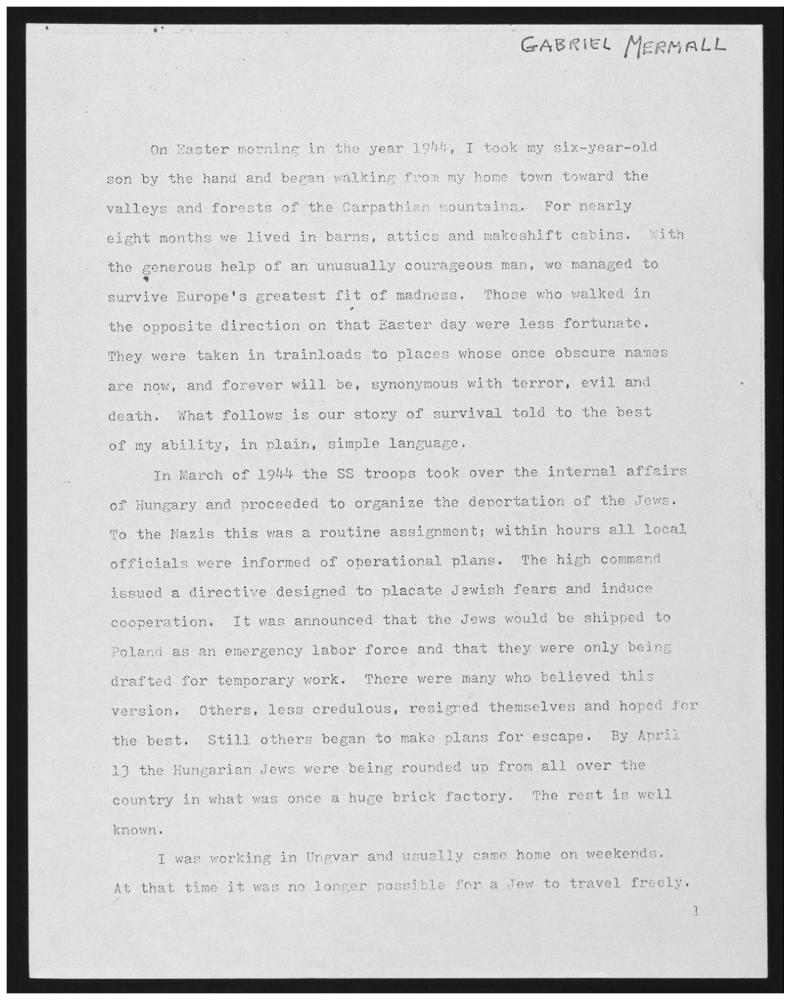

In [32]:
gray_img = gray_image(img)
cv2.imwrite("temp/gray_img.jpg", gray_img)
display("temp/gray_img.jpg")

Here when we say threshold, the matter is straight-forward. For every pixel, the same threshold value is applied. If the pixel value is smaller than or equal to the threshold, it is set to 0, otherwise it is set to a maximum value. The function cv.threshold is used to apply the thresholding. The first argument is the source image, which should be a grayscale image. The second argument is the threshold value which is used to classify the pixel values. The third argument is the maximum value which is assigned to pixel values exceeding the threshold.

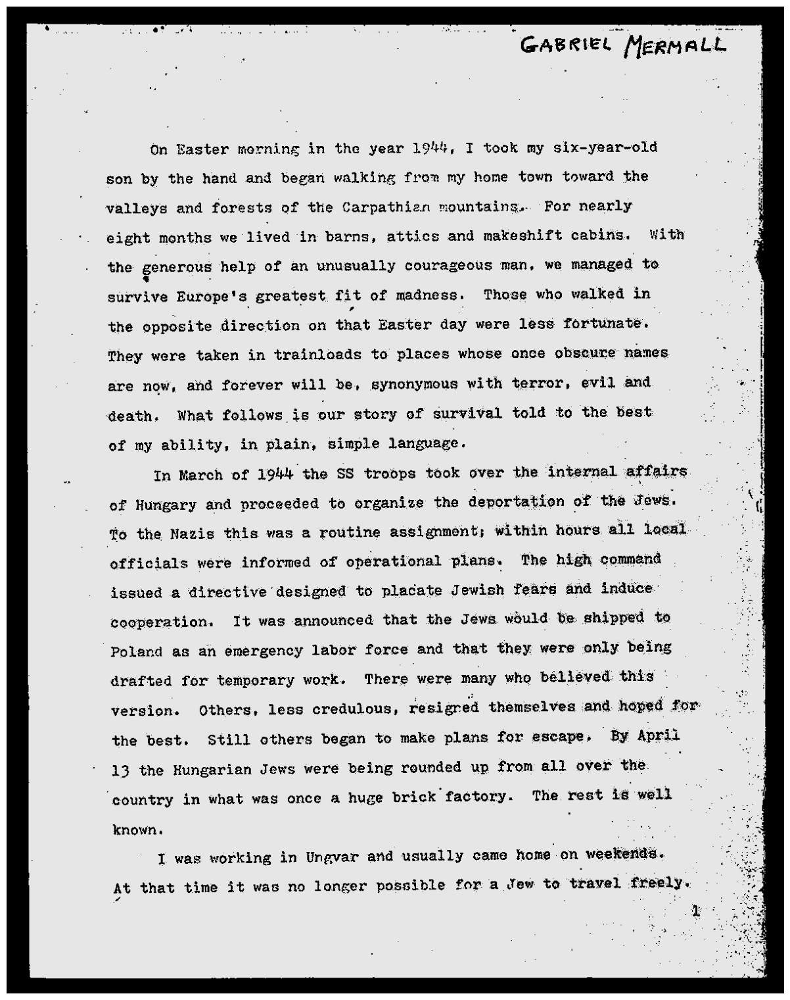

In [42]:
# Binarization

threshold, img_bw = cv2.threshold(gray_img, 210, 230, cv2.THRESH_BINARY)
cv2.imwrite("temp/blackwhite_img.jpg", img_bw)
display("temp/blackwhite_img.jpg")

### Noise removal
Removing pixels that do not correspond or contribute to the task. Make sure it takes the black and white image. See the pixels at top down. 1 is surrounded by all blakc pixels. also weekends word and many other words, Kernel helps to clear the noise. Biggerkernel can sometime distort the image. Make sure to select right kernel

In [43]:
def noise_remove(img):
    import numpy as np
    kernel = np.ones((1, 1), dtype=np.uint8)
    # thickening and thinning the texr
    img = cv2.dilate(img, kernel, iterations=1)
    img = cv2.erode(img, kernel, iterations=1)
    # Noise removal
    img = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
    img = cv2.medianBlur(img, 3)
    return img

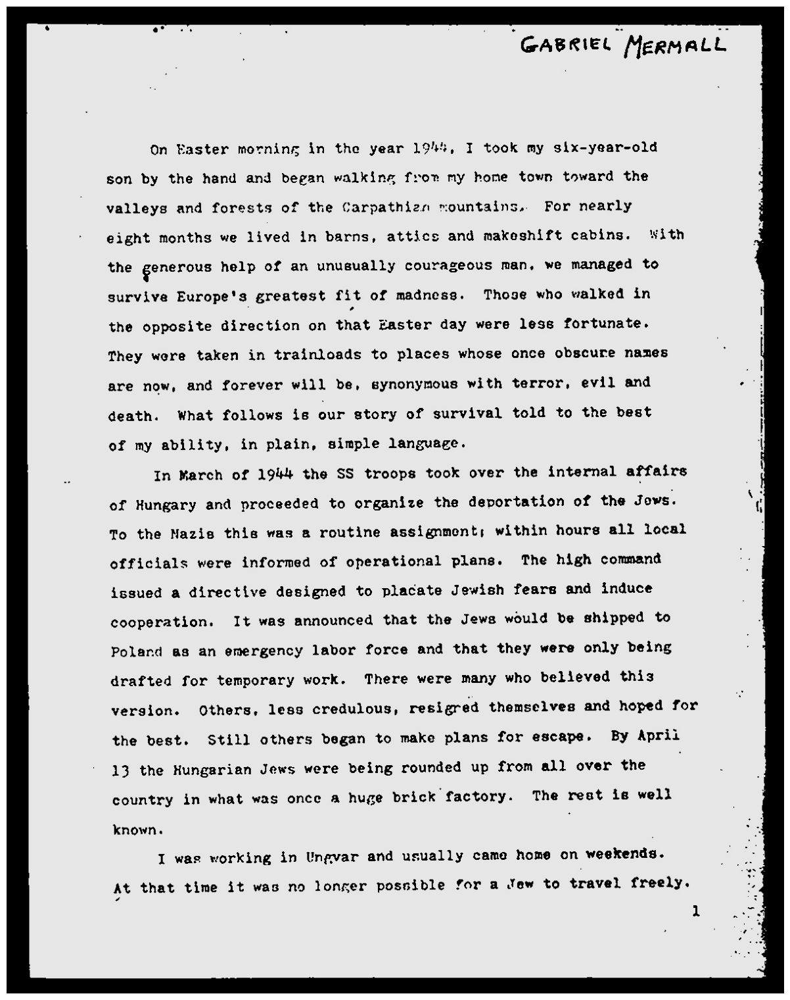

In [45]:
img_noise_removed = noise_remove(img_bw)
cv2.imwrite("temp/img_noise_removed.jpg", img_noise_removed)
display("temp/img_noise_removed.jpg")

### Dilation and Erosion

Dilation thickens the text, erosion thins the text. But they work in reverse order. So we need to first invert the image and then dialte or erode

In [54]:
def thin_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)  # invert
    kernel = np.ones((2, 2), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)  # re invert to get the original
    return (image)

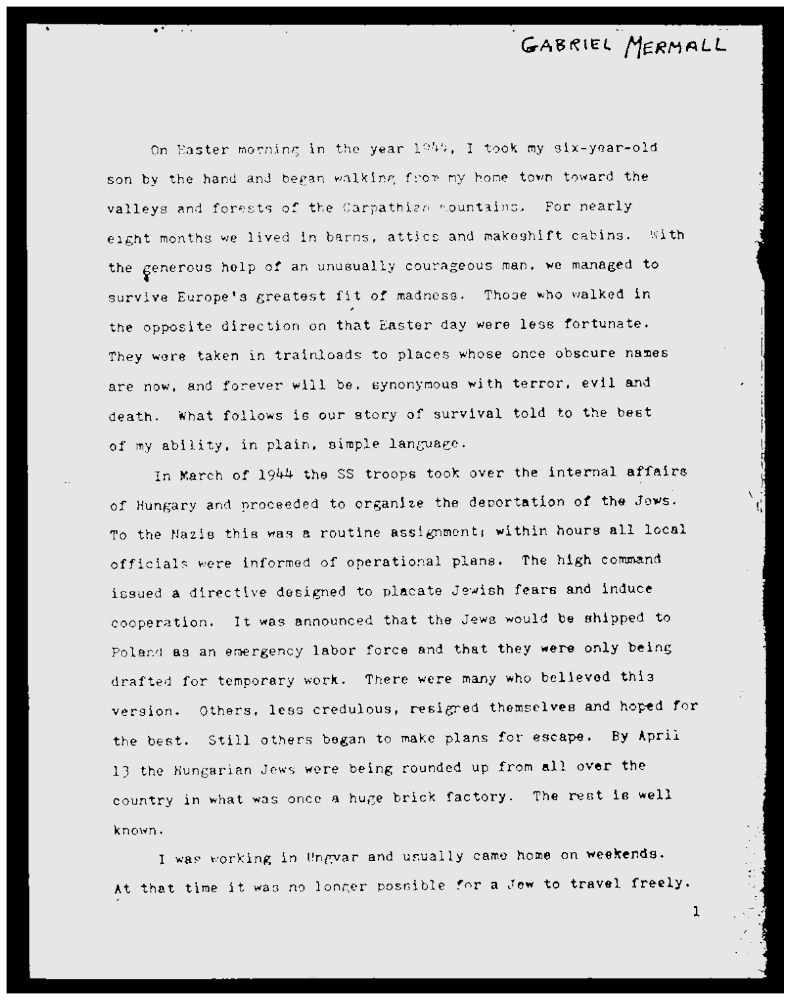

In [55]:

eroded_img = thin_font(img_noise_removed)
cv2.imwrite("temp/eroded_img.jpg", eroded_img)
display("temp/eroded_img.jpg")

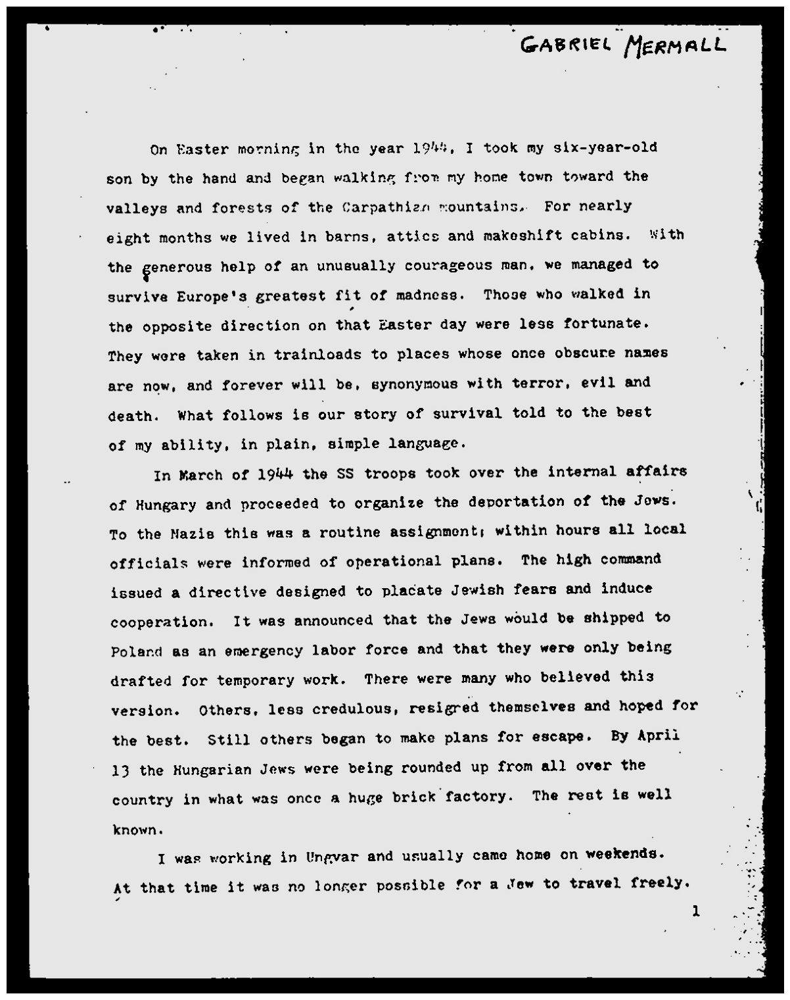

In [56]:
import numpy as np
image = cv2.bitwise_not(img_noise_removed)  # invert
kernel = np.ones((1, 1), np.uint8)
eroded_img = cv2.erode(image, kernel, iterations=2)
eroded_img = cv2.bitwise_not(eroded_img)  # re invert to get the original
cv2.imwrite("temp/eroded_img_1.jpg", eroded_img)
display("temp/eroded_img_1.jpg")

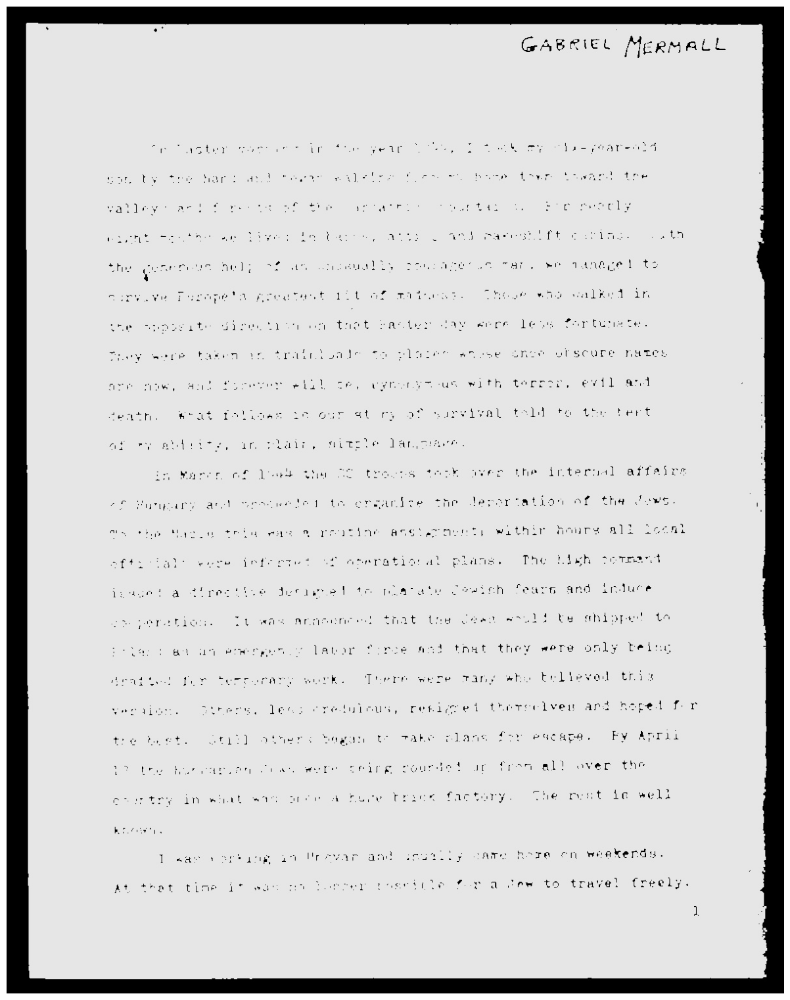

In [58]:
import numpy as np
image = cv2.bitwise_not(img_noise_removed)  # invert
kernel = np.ones((3, 3), np.uint8)
eroded_img = cv2.erode(image, kernel, iterations=1)
eroded_img = cv2.bitwise_not(eroded_img)  # re invert to get the original
cv2.imwrite("temp/eroded_img_1.jpg", eroded_img)
display("temp/eroded_img_1.jpg")

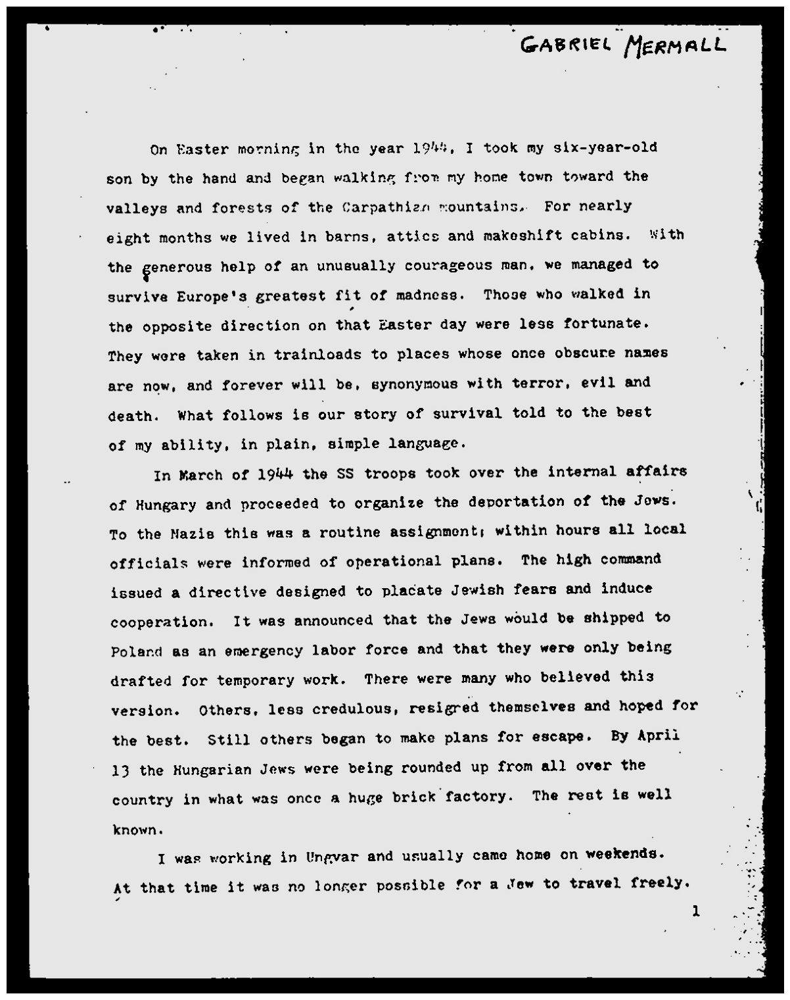

In [61]:
import numpy as np
image = cv2.bitwise_not(img_noise_removed)  # invert
kernel = np.ones((1, 1), np.uint8)
dilated_img = cv2.dilate(image, kernel, iterations=3)
dilated_img = cv2.bitwise_not(dilated_img)  # re invert to get the original
cv2.imwrite("temp/dilated_img.jpg", dilated_img)
display("temp/dilated_img.jpg")

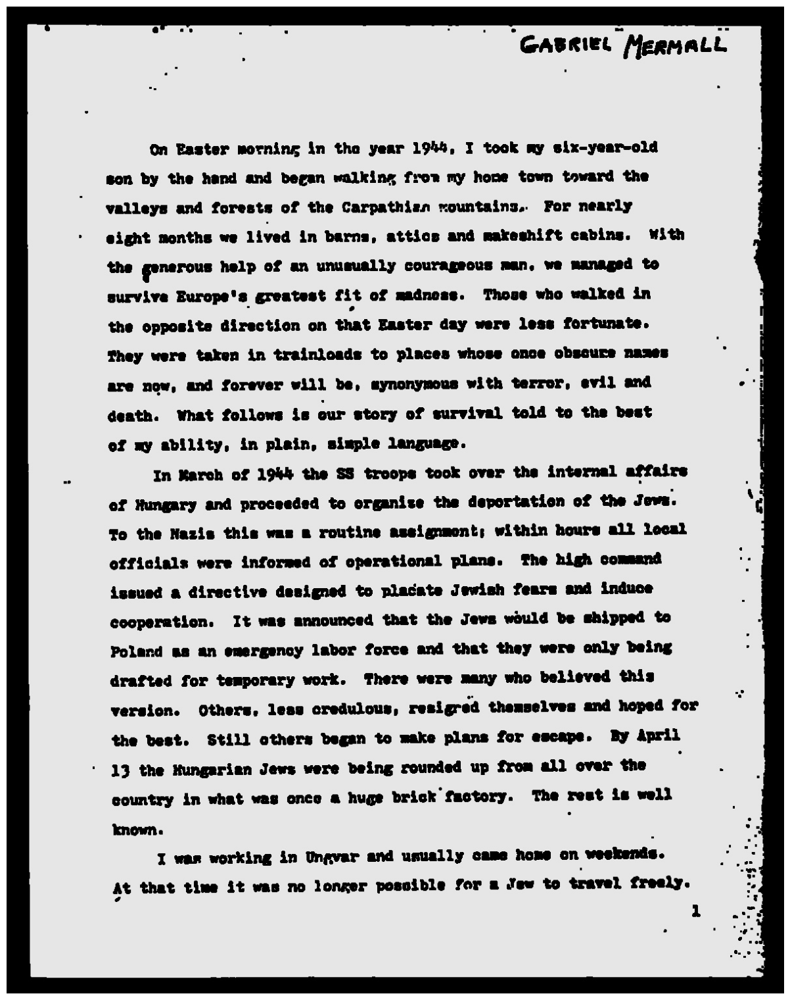

In [59]:
import numpy as np
image = cv2.bitwise_not(img_noise_removed)  # invert
kernel = np.ones((3, 3), np.uint8)
dilated_img = cv2.dilate(image, kernel, iterations=1)
dilated_img = cv2.bitwise_not(dilated_img)  # re invert to get the original
cv2.imwrite("temp/dilated_img.jpg", dilated_img)
display("temp/dilated_img.jpg")

### Rotation / Deskewing

We often get rotated or skewed images. We need to align and correct the rotation and skewness.

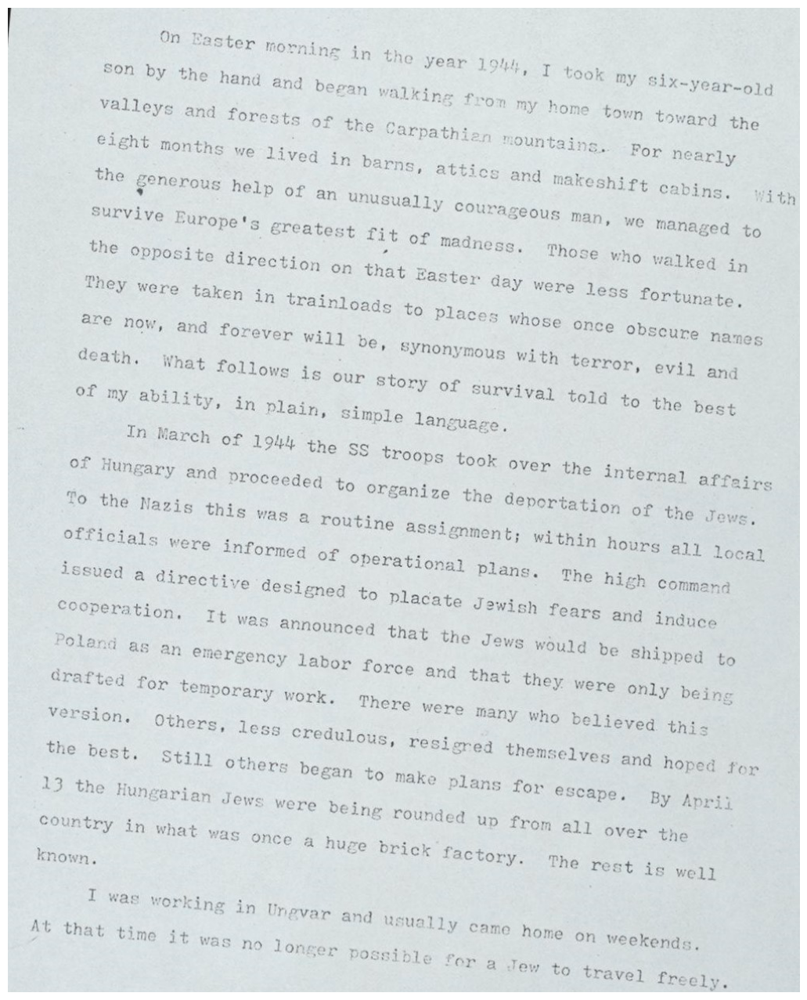

In [63]:
rotated_img = cv2.imread("data/page_01_rotated.JPG")
display("data/page_01_rotated.JPG")

In [64]:
#https://becominghuman.ai/how-to-automatically-deskew-straighten-a-text-image-using-opencv-a0c30aed83df
import numpy as np

def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x, y, w, h = rect
        cv2.rectangle(newImage, (x, y), (x+w, y+h), (0, 255, 0), 2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("temp/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle

# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage

In [65]:
# Deskew image
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

In [66]:
rotated_img_fixed = deskew(rotated_img)
cv2.imwrite("temp/rotated_img_fixed.jpg", rotated_img_fixed)

28


True

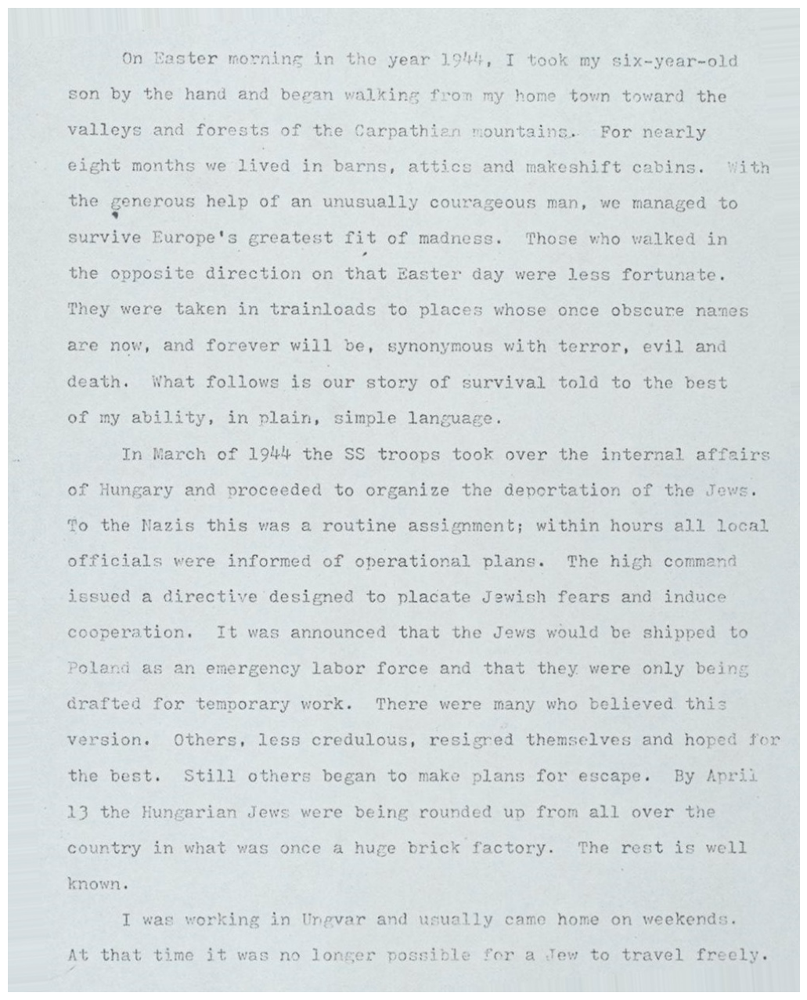

In [67]:
display("temp/rotated_img_fixed.jpg")

### Removing Borders

Before Performing OCR, it is always recommended to borders (here the thick black border) when needed.

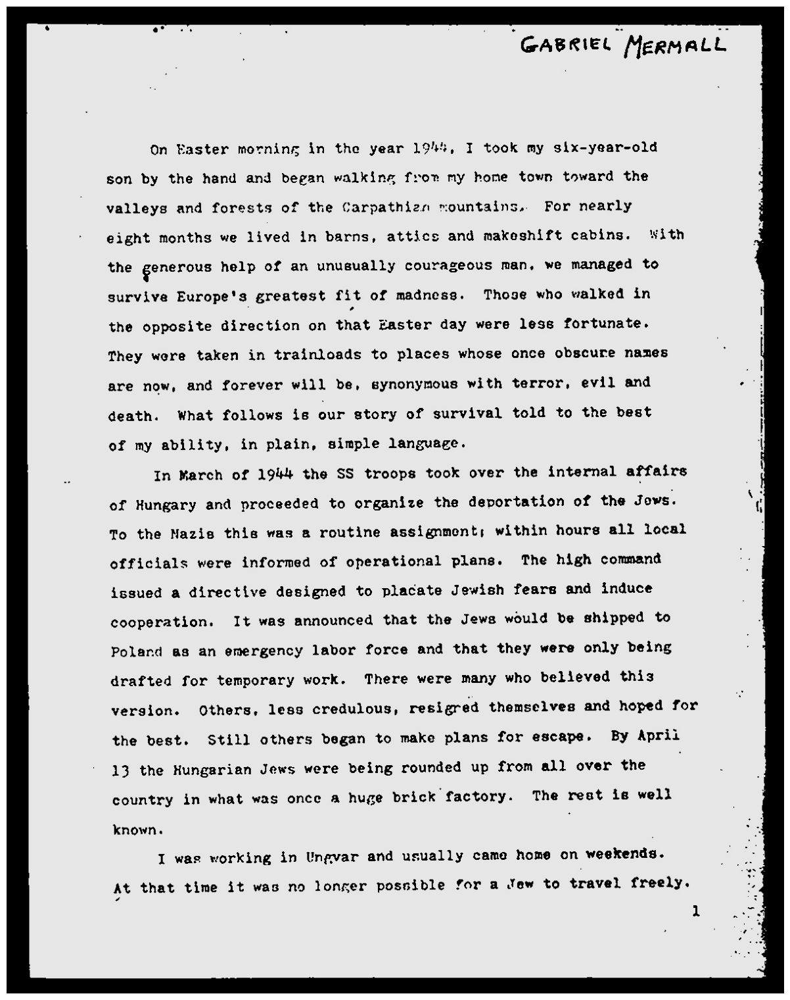

In [68]:
display("temp/img_noise_removed.jpg")

In [ ]:
def remove_borders(image):
    contours, heiarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntsSorted = sorted(contours, key=lambda x: cv2.contourArea(x))
    cnt = cntsSorted[-1]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = image[y:y+h, x:x+w]
    return crop

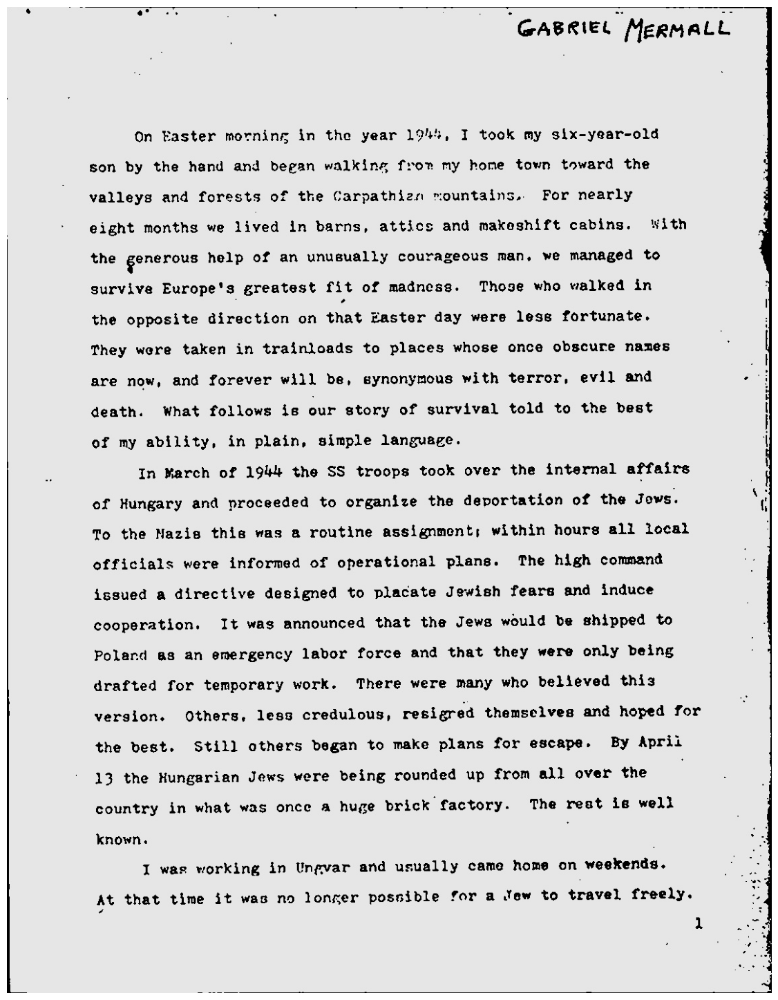

In [70]:
img_no_borders = remove_borders(img_noise_removed)
cv2.imwrite("temp/img_no_borders.jpg", img_no_borders)
display('temp/img_no_borders.jpg')

### Missing Borders

We also need border sometimes when there is text that is skewed beyond borders.

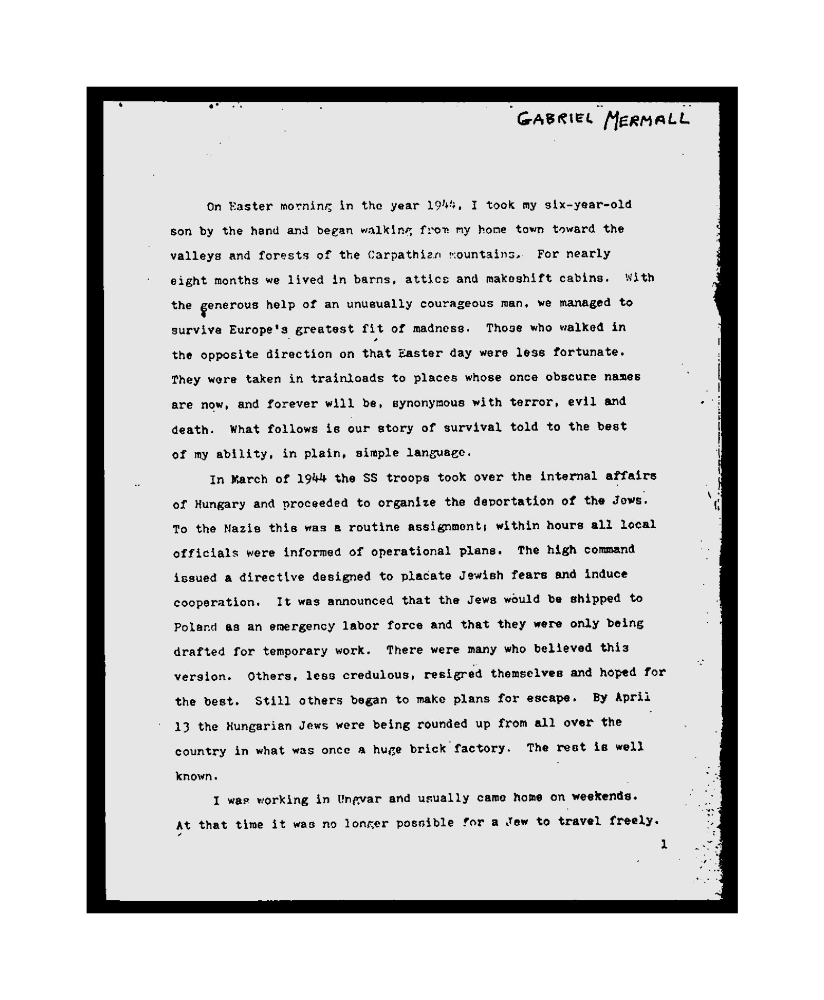

In [71]:
color = [255, 255, 255] # white
top, bottom, left, right = [150] * 4
image_with_border = cv2.copyMakeBorder(img_noise_removed, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
cv2.imwrite("temp/image_with_border.jpg", image_with_border)
display("temp/image_with_border.jpg")